In [1]:
import logging, warnings; logging.getLogger().setLevel(logging.ERROR);
warnings.filterwarnings("ignore")

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import re
from pathlib import Path 

import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.font_manager
import matplotlib.lines as lines


pd.set_option('display.max_rows', 200)

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=12)

sc.settings.n_jobs=-1
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.figdir = '../../1_outputs/0_figures'
sc.settings.verbosity = 1 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

In [2]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [3]:
# preset color palettes and color maps
user_defined_palette =  [ '#F6222E', '#16FF32', '#3283FE', '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']

user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [4]:
pwd

'/Users/mkaur/projects/7_dc/1_pyzone/0_notebooks/0_scRNA'

In [5]:
file_outputs = '../../1_outputs/' 
h5ad = '../../1_outputs/1_h5ad/'

In [6]:
## read in h5ad 

adata = sc.read_h5ad(h5ad + '4_wip_QCed_adata.h5ad')

# Annotations

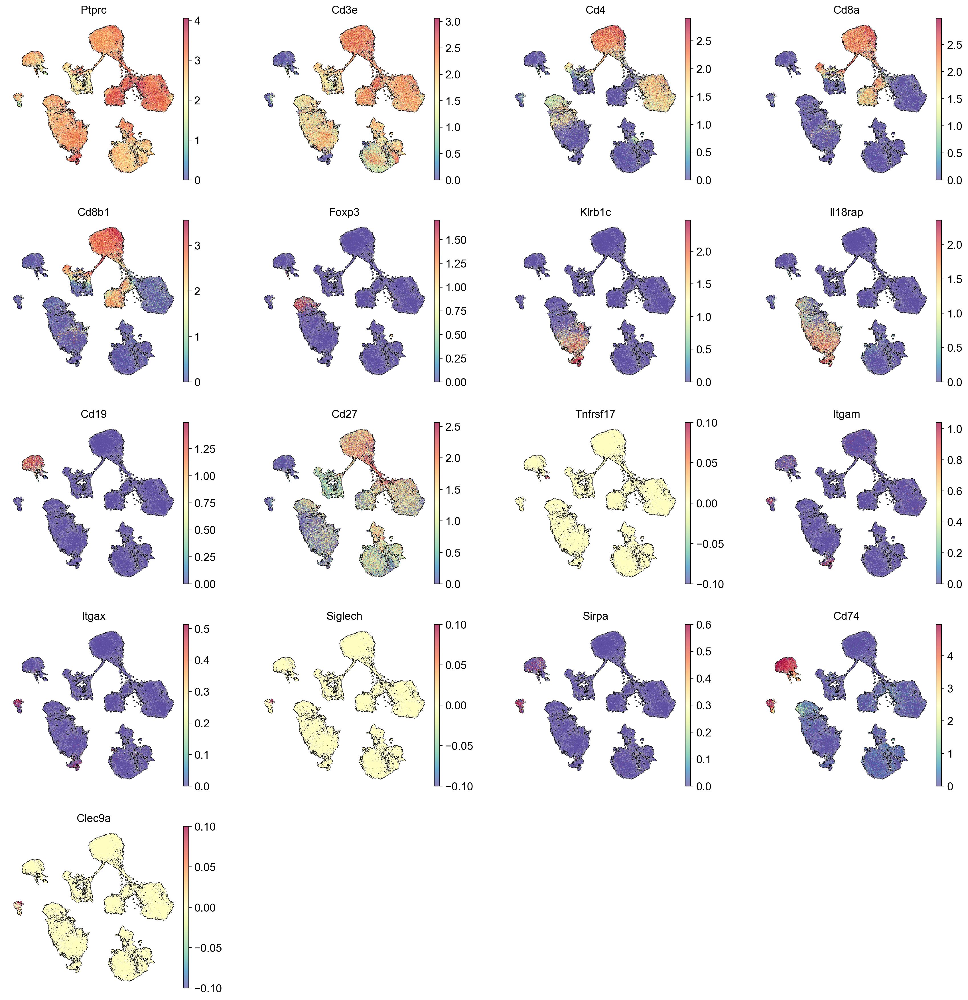

In [12]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'Ptprc',

        #T cells: 
        'Cd3e', 'Cd4', 'Cd8a', 'Cd8b1', 'Foxp3', 

        #NK cells
        'Klrb1c', 'Il18rap',
        
        #B Cells:
        'Cd19', 'Cd27',

        #Plasma Cells: 
        'Tnfrsf17',

        #Myeloid 
        'Itgam', 'Itgax', 'Siglech', 'Sirpa', 'Cd74', 'Clec9a'

        
        
          ],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    vmax='p99',
    frameon=False,
    add_outline=True,
    sort_order = False,
)

In [13]:
#0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 
#1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0

for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, key_added='leiden_'+str(resolution_parameter))

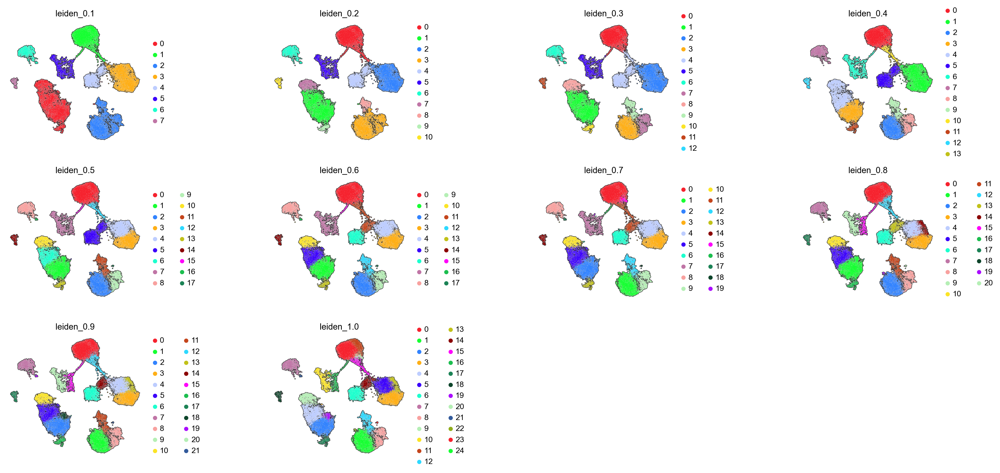

In [14]:
#'leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
#'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'

sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5',
        'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
           ], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    #size=35,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [15]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden_0.3',  # Change the Leiden clustering
                        method='wilcoxon',
                        use_raw=False)

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names

df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(150)

#df.to_csv(file_outputs + '', index = False)

df.head(25)

,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n,9_n,10_n,11_n,12_n
0,Themis,Il2rb,Bach2,Setd7,Cd226,Hmgb2,Cd74,Myl10,Tnfrsf4,Ikzf2,Fcer1g,Cst3,Itgav
1,Rag1,AW112010,Lef1,Hes1,Lef1,Stmn1,Cd79a,Cdk6,Itgav,Pdcd1,Tyrobp,Ifi30,Tnfrsf9
2,Glcci1,Ahnak,Itm2a,Hdac4,Itgae,Pclaf,H2-Eb1,Plac8,Rora,Sox5,Irf8,Ctsz,Foxp3
3,Cd8b1,Il18r1,Cd2,Fkbp5,Ccr7,Mki67,Mef2c,5830418P13Rik,Gm20275,Trdc,Ccl5,Spi1,Ttc39c
4,Mier1,H2-K1,Tmsb10,Il2ra,Fam241a,H2afz,Blnk,Tcrg-C2,Traf1,Tcrg-C4,Il2rb,Tyrobp,Tnfrsf4
5,Mad1l1,Il7r,Ccr7,Jdp2,Cd8a,Top2a,Lyn,Rnf220,Rabgap1l,Tcrg-C2,Gzma,Ctsh,Myl10
6,Ssbp2,Fasl,Chd3,Desi1,Cd8b1,Tuba1b,H2-Aa,Crip1,Nrp1,Plac8,Prf1,Csf2rb,Cd83
7,Gm4258,Gm2682,Rgs10,5830418P13Rik,Tmsb10,Hmgn2,H2-Ab1,Atp8b4,Sntb1,Trgv2,Klrb1c,Skap2,Rora
8,Arpp21,Ttc39b,Dusp10,Tcrg-C2,Jak1,Tmpo,Ms4a1,Gm4632,Ctla4,Hdac9,Serpinb9,Syngr2,Areg
9,Cd8a,AU020206,Satb1,Ptpre,Bach2,Tubb5,Ebf1,Il2ra,Ikzf2,Tcrg-C1,Klrk1,Cd74,Ifi44


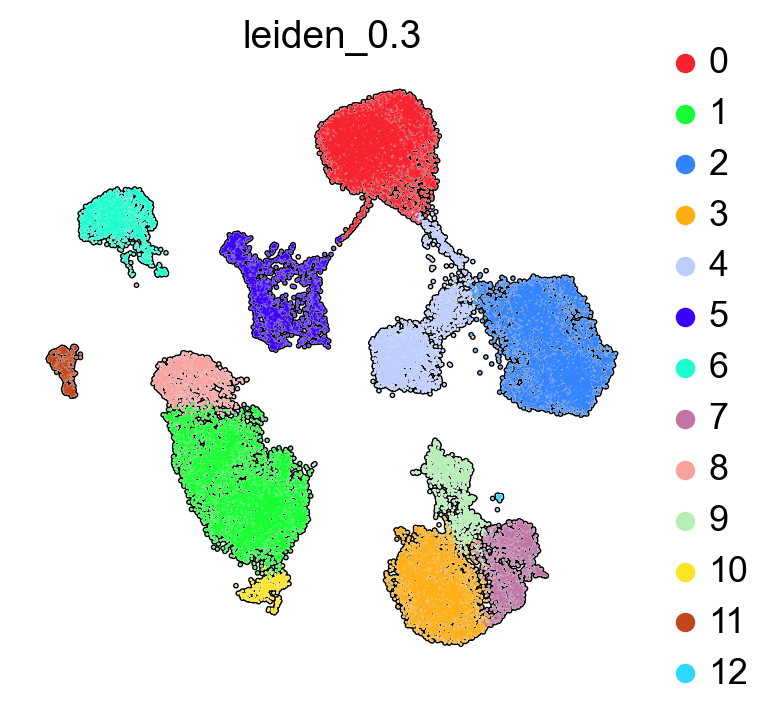

In [16]:
#'leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
#'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'

sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'leiden_0.3'
           ], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    #size=35,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [17]:
cell_type_groups = {
    'DN_DP' : ['5', '0', '3', '7', '9', '12'], 
    'B' : ['6'],
    'Myeloid' : ['11'],
    'ILC': ['1', '10'], 
    'SP': ['2', '4', '8']
    # add more as needed
}

cluster_to_cell_type = {cluster: cell_type for cell_type, clusters in cell_type_groups.items() for cluster in clusters}

In [18]:
adata.obs['cell_type'] = adata.obs['leiden_0.3'].map(cluster_to_cell_type) #Add Leiden Cluster

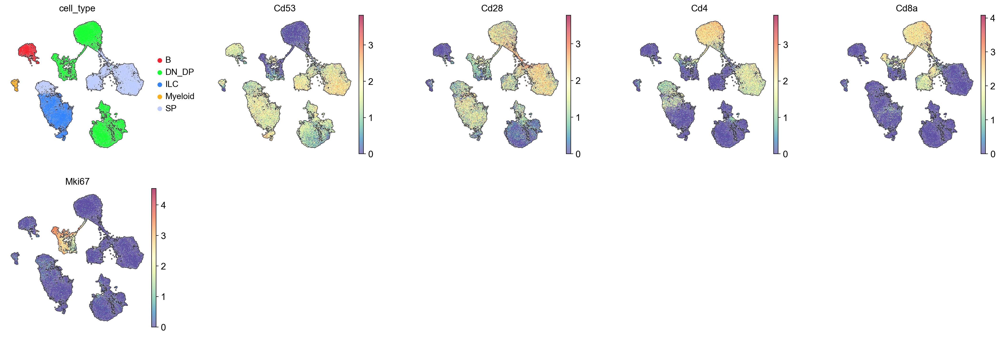

In [36]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'cell_type', 'Cd53', 'Cd28', 'Cd4', 'Cd8a', 'Mki67'
          ],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False, 
)

In [20]:
adata.write_h5ad(h5ad + '4_wip_QCed_adata.h5ad')

## Create Subsets

In [21]:
adata.obs['cell_type'].unique()

['ILC', 'DN_DP', 'SP', 'B', 'Myeloid']
Categories (5, object): ['B', 'DN_DP', 'ILC', 'Myeloid', 'SP']

In [22]:
dn_dp = adata[adata.obs['cell_type'].isin(['DN_DP'])].copy()
dn_dp

AnnData object with n_obs × n_vars = 16423 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
  

In [23]:
dn_dp.write_h5ad(h5ad + '4_dn_dp.h5ad')

In [24]:
sp = adata[adata.obs['cell_type'].isin(['SP'])].copy()
sp

AnnData object with n_obs × n_vars = 11579 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
  

In [25]:
sp.write_h5ad(h5ad + '5_sp.h5ad')

In [26]:
b = adata[adata.obs['cell_type'].isin(['B'])].copy()
b

AnnData object with n_obs × n_vars = 1856 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
   

In [27]:
b.write_h5ad(h5ad + '6_bcells.h5ad')

In [28]:
ilc = adata[adata.obs['cell_type'].isin(['ILC'])].copy()
ilc

AnnData object with n_obs × n_vars = 7394 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
   

In [29]:
ilc.write_h5ad(h5ad + '7_nk_ilc.h5ad')

In [30]:
myeloid = adata[adata.obs['cell_type'].isin(['Myeloid'])].copy()
myeloid

AnnData object with n_obs × n_vars = 378 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    

In [31]:
myeloid.write_h5ad(h5ad + '8_myeloid.h5ad')